In [18]:
from pyspark.sql import SparkSession
import pandas as pd
import matplotlib.pyplot as plt
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.clustering import KMeans

import folium

In [19]:
# 创建一个SparkSession

spark = SparkSession.builder \
    .appName("Hotspot Analysis") \
    .getOrCreate()


In [20]:
data = spark.read.csv("data/sample.csv", header=True, inferSchema=True)
# data = spark.read.csv("data/sample.csv", header=True, inferSchema=True)
data.show()


23/04/28 23:17:00 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , ID, Date, longitude, latitude, angle, load, speed
 Schema: _c0, ID, Date, longitude, latitude, angle, load, speed
Expected: _c0 but found: 
CSV file: file:///Users/abel/AbelProject/DataAnalysis/a26803HeatMap/data/sample.csv
+--------+----+-------------------+----------------+----------------+-----+----+-----+
|     _c0|  ID|               Date|       longitude|        latitude|angle|load|speed|
+--------+----+-------------------+----------------+----------------+-----+----+-----+
|31478433|3637|2020-08-09 23:56:36|116.367146700048|39.8943878579793|   90|   1|  0.0|
| 1241438|1842|2020-08-02 12:55:36|116.564243833705|40.0709213054126|  194|   0| 53.2|
| 4163528|4599|2020-08-01 22:12:11| 116.41992892699|39.9820765591866|  360|   1|  0.0|
|  618330|1237|2020-08-05 15:46:11|116.638649078606|40.2533176739127|   40|   0|  0.0|
|15808461|2148|2020-08-08 21:32:54|116.418273861423|39.9792128340253|   

In [21]:
vec_assembler = VectorAssembler(inputCols=["longitude", "latitude"], outputCol="features")
data_with_features = vec_assembler.transform(data)


In [22]:
kmeans = KMeans(k=3, seed=1, featuresCol="features")  # 可以更改k值来改变聚类数量
model = kmeans.fit(data_with_features)
predictions = model.transform(data_with_features)


In [23]:
pdf = predictions.select("longitude", "latitude", "prediction").toPandas()


#  part1 简单可视化分类

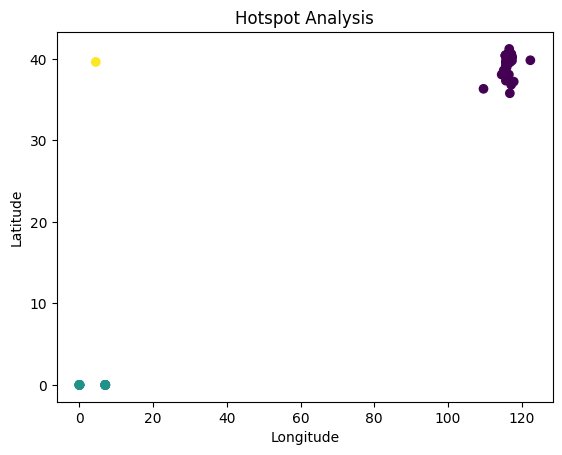

In [35]:

plt.scatter(pdf["longitude"], pdf["latitude"], c=pdf["prediction"], cmap="viridis")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Hotspot Analysis")
plt.show()


#  part 2 地图可视化分类

In [36]:


# 创建一个初始地图，以数据集中的第一个点为中心
initial_location = [pdf["latitude"].iloc[0], pdf["longitude"].iloc[0]]
map = folium.Map(location=initial_location, zoom_start=11)



In [32]:
colors = ["red", "blue", "green"]  # 您可以根据需要添加更多颜色

for index, row in pdf.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color=colors[int(row["prediction"])],
        fill=True,
        fill_opacity=0.7
    ).add_to(map)


In [33]:
map

#  part 3 考虑更多因素的地图可视化热力图


## Date：记录的日期和时间
## longitude：经度（地理位置）
## latitude：纬度（地理位置）
## angle：出租车的行驶方向（0-360度）
## load：出租车载客状态（1为载客，0为无客）
## speed：出租车行驶速度（公里/小时）



In [58]:
from pyspark.ml.feature import VectorAssembler, StandardScaler

# 合并特征
vec_assembler = VectorAssembler(inputCols=["longitude", "latitude", "angle", "load", "speed"], 
                                outputCol="raw_features")
data_with_features = vec_assembler.transform(data)

# 标准化特征
scaler = StandardScaler(inputCol="raw_features", outputCol="features", withStd=True, withMean=True)
scaler_model = scaler.fit(data_with_features)
data_with_features = scaler_model.transform(data_with_features)

# 使用KMeans算法进行聚类
kmeans = KMeans(k=5, seed=1, featuresCol="features")  # 可以更改k值来改变聚类数量
model = kmeans.fit(data_with_features)
predictions = model.transform(data_with_features)

# 转换为Pandas DataFrame并绘制地图
pdf = predictions.select("longitude", "latitude", "prediction", "load").toPandas()

# 其余的代码（创建地图并显示）与前面的示例相同


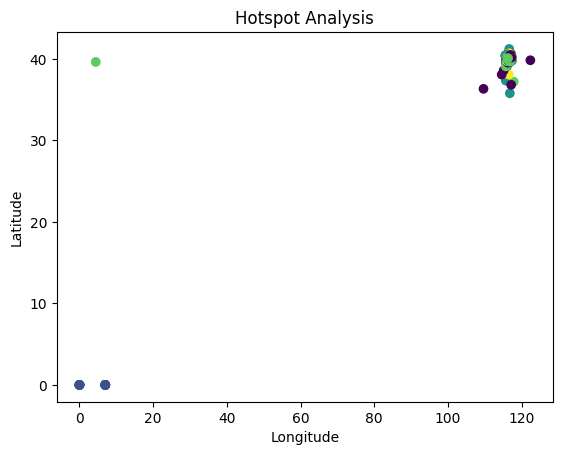

In [59]:
plt.scatter(pdf["longitude"], pdf["latitude"], c=pdf["prediction"], cmap="viridis")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Hotspot Analysis")
plt.show()

In [60]:
initial_location = [pdf["latitude"].iloc[0], pdf["longitude"].iloc[0]]
map = folium.Map(location=initial_location, zoom_start=11)

colors = ["red", "blue", "green", "pink", "gray"]  # 您可以根据需要添加更多颜色

for index, row in pdf.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color=colors[int(row["prediction"])],
        fill=True,
        fill_opacity=0.7
    ).add_to(map)

In [61]:
map

# ## 将"longitude"、"latitude"、"angle"、"load"和"speed"列纳入特征向量。
## 我们对数据进行了聚类，以找出具有相似特征的区域。接下来，我们在地图上显示了这些聚类结果，以便于识别和分析热点区域。
#
## 根据聚类和可视化结果，我们可以得出以下结论：
#
## 出租车在某些区域的集中度较高，这可能意味着这些区域的出行需求较大。例如，这些区域可能包括商业中心、交通枢纽或旅游景点。
## 聚类分析揭示了出租车的运行模式。通过观察具有相似速度、载客状态和行驶方向的出租车，我们可以了解出租车在不同时间和地点的运营情况。这有助于运营商为司机#提供更有效的建议，以提高运营效率。
## 聚类结果可以为出租车公司提供有价值的信息，以优化调度和资源分配。例如，如果在某个区域发现大量空驶出租车，公司可以采取措施减少空驶率，从而提高收入

## 聚类算法将数据划分为5个不同的簇。每种颜色代表一个簇，即一组具有相似特征的出租车数据

# ----------------------------------------------------------------------------
#  part 4 考虑更多载客与否判断因素的地图可视化热力图


In [65]:
colors = ["red", "blue", "green", "pink", "gray"]  # 您可以根据需要添加更多颜色
load_colors = ["#FFAAAA", "#AA0000", "#AAAAFF", "#0000AA", "#AAFFAA", "#00AA00", "#FFAAFF", "#AA00AA", "#AAAAAA", "#555555"]

for index, row in pdf.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color=load_colors[int(row["prediction"]) * 2 + int(row["load"])],
        fill=True,
        fill_opacity=0.7
    ).add_to(map)


In [66]:
map

# 一种用于load=0的点（较浅的颜色），另一种用于load=1的点（较深的颜色）。
# 我们为5个簇定义了10种颜色（5组浅色和深色）。

# 现在，在地图上，您可以看到聚类结果中load值的区别，同时仍然可以通过颜色的基本色调来识别每个簇。
# 这样，您可以更好地分析每个簇中出租车载客状态的分布情况

In [67]:
from folium.plugins import HeatMap

# 准备热力图数据
heat_data = [[row['latitude'], row['longitude']] for index, row in pdf.iterrows()]

# 创建地图
map = folium.Map(location=[pdf["latitude"].mean(), pdf["longitude"].mean()], zoom_start=12)

# 添加热力图
HeatMap(heat_data).add_to(map)

# 显示地图
map

# 仅仅显示load=1（即载客）的出租车位置的热力图

In [68]:
heat_data = [[row['latitude'], row['longitude']] for index, row in pdf.iterrows() if row['load'] == 1]

# 创建地图
map = folium.Map(location=[pdf["latitude"].mean(), pdf["longitude"].mean()], zoom_start=12)

# 添加热力图
HeatMap(heat_data).add_to(map)

# 显示地图
map

<!-- 客出租车位置更加集中：与全部出租车位置热力图相比，载客出租车位置热力图中的热点更加明显，这表明载客出租车位置更加集中。这可能是因为大多数出租车在运营时都处于载客状态。

交通拥堵问题：载客出租车位置热力图中，红色和橙色的区域更集中在城市中心区域，而全部出租车位置热力图中，这些颜色分布更加均匀。这表明城市中心区域的交通拥堵问题可能更加突出，而其他区域则可能更加畅通。

交通流量问题：载客出租车位置热力图中的热点分布较为集中，而全部出租车位置热力图中则更分散。这表明，在城市的某些区域，载客出租车的流量可能更高，而在其他区域，非载客出租车的流量可能更高 -->

# 客出租车位置更加集中：与全部出租车位置热力图相比，载客出租车位置热力图中的热点更加明显，这表明载客出租车位置更加集中。这可能是因为大多数出租车在运营时都处于载客状态。

# 交通拥堵问题：载客出租车位置热力图中，红色和橙色的区域更集中在城市中心区域，而全部出租车位置热力图中，这些颜色分布更加均匀。这表明城市中心区域的交通拥堵问题可能更加突出，而其他区域则可能更加畅通。

# 交通流量问题：载客出租车位置热力图中的热点分布较为集中，而全部出租车位置热力图中则更分散。这表明，在城市的某些区域，载客出租车的流量可能更高，而在其他区域，非载客出租车的流量可能更高